### DATA SOURCE

https://www.kaggle.com/datasets/snehangsude/audible-dataset?select=audible_uncleaned.csv

Import Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import seaborn as sns
sns.set_style('whitegrid') # just optional!
%matplotlib inline

#Setting display format to retina in matplotlib to see better quality images.
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

# Lines below are just to ignore warnings
import warnings
warnings.filterwarnings('ignore')


/var/folders/vr/kkhzspg52hl2bjkwytn788nm0000gp/T/ipykernel_4588/4145326070.py:11: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('retina')


Import the data set

In [2]:
audible = pd.read_csv('audible_uncleaned.csv')

Data Exploration

In [3]:
audible.head()

,name,author,narrator,time,releasedate,language,stars,price
0,Geronimo Stilton #11 & #12,Writtenby:GeronimoStilton,Narratedby:BillLobely,2 hrs and 20 mins,04-08-08,English,5 out of 5 stars34 ratings,468.00
1,The Burning Maze,Writtenby:RickRiordan,Narratedby:RobbieDaymond,13 hrs and 8 mins,01-05-18,English,4.5 out of 5 stars41 ratings,820.00
2,The Deep End,Writtenby:JeffKinney,Narratedby:DanRussell,2 hrs and 3 mins,06-11-20,English,4.5 out of 5 stars38 ratings,410.00
3,Daughter of the Deep,Writtenby:RickRiordan,Narratedby:SoneelaNankani,11 hrs and 16 mins,05-10-21,English,4.5 out of 5 stars12 ratings,615.00
4,"The Lightning Thief: Percy Jackson, Book 1",Writtenby:RickRiordan,Narratedby:JesseBernstein,10 hrs,13-01-10,English,4.5 out of 5 stars181 ratings,820.00


In [4]:
audible.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   name         87489 non-null  object
 1   author       87489 non-null  object
 2   narrator     87489 non-null  object
 3   time         87489 non-null  object
 4   releasedate  87489 non-null  object
 5   language     87489 non-null  object
 6   stars        87489 non-null  object
 7   price        87489 non-null  object
dtypes: object(8)
memory usage: 5.3+ MB


Cleaning Author Name column (removing 'written by') and casting it from 'string' to 'tuple' to allow us to search by author:

1.The function extracts the value associated with the key 'author' from the dictionary x.

2.It then splits the value on the colon (:) character using the split() method and assigns the resulting list to the variable author_name.

3.The function then takes the second element of the author_name list (the part after the colon) and assigns it back to author_name. This assumes that the author's name follows the format ": first author,  second author".

4.The function then splits the author_name string on the comma (,) character using the split() method and assigns the 

5.resulting list to the variable author_name.
Finally, the function returns author_name as a tuple.

In [5]:
def updateAuthorName(x):
    author_name = x['author'].split(':')
    author_name = author_name[1]
    author_name = tuple(author_name.split(","))
    return author_name

Create a new column called 'author_names'

In [6]:
audible['author_names'] = audible.apply(updateAuthorName,axis=1)

In [7]:
audible

,name,author,narrator,time,releasedate,language,stars,price,author_names
0,Geronimo Stilton #11 & #12,Writtenby:GeronimoStilton,Narratedby:BillLobely,2 hrs and 20 mins,04-08-08,English,5 out of 5 stars34 ratings,468.00,"(GeronimoStilton,)"
1,The Burning Maze,Writtenby:RickRiordan,Narratedby:RobbieDaymond,13 hrs and 8 mins,01-05-18,English,4.5 out of 5 stars41 ratings,820.00,"(RickRiordan,)"
2,The Deep End,Writtenby:JeffKinney,Narratedby:DanRussell,2 hrs and 3 mins,06-11-20,English,4.5 out of 5 stars38 ratings,410.00,"(JeffKinney,)"
3,Daughter of the Deep,Writtenby:RickRiordan,Narratedby:SoneelaNankani,11 hrs and 16 mins,05-10-21,English,4.5 out of 5 stars12 ratings,615.00,"(RickRiordan,)"
4,"The Lightning Thief: Percy Jackson, Book 1",Writtenby:RickRiordan,Narratedby:JesseBernstein,10 hrs,13-01-10,English,4.5 out of 5 stars181 ratings,820.00,"(RickRiordan,)"
...,...,...,...,...,...,...,...,...,...
87484,Last Days of the Bus Club,Writtenby:ChrisStewart,Narratedby:ChrisStewart,7 hrs and 34 mins,09-03-17,English,Not rated yet,596.00,"(ChrisStewart,)"
87485,The Alps,Writtenby:StephenO'Shea,Narratedby:RobertFass,10 hrs and 7 mins,21-02-17,English,Not rated yet,820.00,"(StephenO'Shea,)"
87486,The Innocents Abroad,Writtenby:MarkTwain,Narratedby:FloGibson,19 hrs and 4 mins,30-12-16,English,Not rated yet,938.00,"(MarkTwain,)"
87487,A Sentimental Journey,Writtenby:LaurenceSterne,Narratedby:AntonLesser,4 hrs and 8 mins,23-02-11,English,Not rated yet,680.00,"(LaurenceSterne,)"


Same method used to clean 'narrator' column:

1.The function extracts the value associated with the key 'narrator' from the dictionary x.

2.It then splits the value on the colon (:) character using the split() method and assigns the resulting list to the variable narrator_name.

3.The function then takes the second element of the narrator_name list (the part after the colon) and assigns it back to narrator_name. This assumes that the narrator's name follows the format "first narrot, second narrot".

4.The function then splits the narrator_name string on the comma (,) character using the split() method and assigns the resulting list to the variable narrator_name.

5.Finally, the function returns narrator_name as a tuple.

In [8]:
def updateNarratorName(x):
    narrator_name = x['narrator'].split(':')
    narrator_name = narrator_name[1]
    narrator_name = tuple(narrator_name.split(","))
    return narrator_name

Create a new column called 'narrator_names'

In [9]:
audible['narrator_names'] = audible.apply(updateNarratorName,axis=1)

1.The function extracts the value associated with the key 'time' from the dictionary x.

2.It then splits the value on the space character using the split() method and assigns the resulting list to the variable TimeList.

3.The function initializes a variable LengthM to 0, which will represent the length of the audio in minutes.

4.The function then iterates over the TimeList using a for loop and checks the units of time associated with each value in the list.

5.If the unit of time is 'hrs' or 'hr', the function multiplies the value by 60 and adds the result to LengthM.

6.If the unit of time is 'mins' or 'min', the function simply adds the value to LengthM.

7.If the unit of time is 'minute' or 'minutes', the function again adds the value to LengthM.

8.Finally, the function returns LengthM, which represents the length of the audio in minutes.

In [10]:
def setLength(x):
    TimeList = x['time'].split(' ')
    LengthM = 0
    for i in range(0,len(TimeList)-1):
        if TimeList[i+1] == 'hrs' or TimeList[i+1] == 'hr':
            LengthM += int(TimeList[i])*60
        elif TimeList[i+1] == 'mins' or TimeList[i+1] == 'min':
            LengthM += int(TimeList[i])
        elif TimeList[i+1] == 'minute' or TimeList[i+1] == 'minutes':
            LengthM += int(TimeList[i])
    return LengthM

Create a new column 'length_minutes'

In [11]:
audible['length_minutes'] = audible.apply(setLength,axis=1)

Cleaning 'stars' column by splitting the rate(Stars):

1.This function initializes an empty string stars, which will represent the number of stars.

2.The function extracts the value associated with the key 'stars' from the dictionary x.

3.It then splits the value on the space character using the split() method and assigns the resulting list to the variable starsList.

4.The function then iterates over the starsList using a for loop and checks each value and the next one in the list.

5.If the next value is 'out', then the current value represents the number of stars, so the function assigns this value to stars.

6.Finally, if stars is not an empty string, the function returns stars.

In [12]:
def setStars(x):
    stars = ''
    starsList = x['stars'].split(' ')
    for i in range (0,len(starsList)-1):
        if starsList[i+1] == 'out':
            stars = starsList[i]
    if stars != '':
        return stars

Create a new column for the rating

In [13]:
audible['rating'] = audible.apply(setStars,axis=1)

Splitting number of ratings:

1.The function initializes an empty string Ratings, which will represent the number of ratings.

2.The function extracts the value associated with the key 'stars' from the dictionary x.

3.It then splits the value on the space character using the split() method and assigns the resulting list to the variable RatingList.

4.The function then iterates over the RatingList using a for loop and checks each value and the next one in the list.

5.If the next value is 'ratings' or 'rating', then the current value represents the number of ratings, so the function extracts the number from the string and assigns it to Ratings.

6.Finally, if Ratings is not an empty string, the function returns Ratings.

In [14]:
def setRatingNum(x):
    Ratings = ''
    RatingList = x['stars'].split(' ')
    for i in range (0,len(RatingList)-1):
        if RatingList[i+1] == 'ratings' or RatingList[i+1] == 'rating':
            Ratings = RatingList[i][5:]
    if Ratings != '':
        return Ratings

Create a new column for rating quantity 'RatingNum'

In [15]:
audible['RatingNum'] = audible.apply(setRatingNum,axis=1)

In [16]:
audible.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   name            87489 non-null  object
 1   author          87489 non-null  object
 2   narrator        87489 non-null  object
 3   time            87489 non-null  object
 4   releasedate     87489 non-null  object
 5   language        87489 non-null  object
 6   stars           87489 non-null  object
 7   price           87489 non-null  object
 8   author_names    87489 non-null  object
 9   narrator_names  87489 non-null  object
 10  length_minutes  87489 non-null  int64 
 11  rating          15072 non-null  object
 12  RatingNum       15072 non-null  object
dtypes: int64(1), object(12)
memory usage: 8.7+ MB


Convert the releasedate to 'datetime' format

In [17]:
def stDate(x):
    return pd.to_datetime(x['releasedate'], format = '%d-%m-%y')

In [18]:
audible['released_date'] = audible.apply(stDate,axis=1)

Create a new column for released date by 'year'

In [19]:
audible['year'] = audible['released_date'].dt.year

In [20]:
audible.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   name            87489 non-null  object        
 1   author          87489 non-null  object        
 2   narrator        87489 non-null  object        
 3   time            87489 non-null  object        
 4   releasedate     87489 non-null  object        
 5   language        87489 non-null  object        
 6   stars           87489 non-null  object        
 7   price           87489 non-null  object        
 8   author_names    87489 non-null  object        
 9   narrator_names  87489 non-null  object        
 10  length_minutes  87489 non-null  int64         
 11  rating          15072 non-null  object        
 12  RatingNum       15072 non-null  object        
 13  released_date   87489 non-null  datetime64[ns]
 14  year            87489 non-null  int64         
dtypes:

In [21]:
#audible.drop(['author','narrator','time','releasedate','stars'],axis=1,inplace=True)

In [22]:
audible.RatingNum.value_counts()

1        5822
2        2315
3        1207
4         857
5         535
         ... 
5,500       1
536         1
287         1
2,236       1
126         1
Name: RatingNum, Length: 384, dtype: int64

In [23]:
audible.rating.value_counts().sort_index()

1       175
1.5       8
2       182
2.5      47
3       711
3.5     413
4      2729
4.5    4046
5      6761
Name: rating, dtype: int64

Replace string 'Free' to string '0' in price column.

In [24]:
audible.price = audible.apply(lambda x: '0' if x['price'] == 'Free' else x['price'], axis=1)

In [25]:
audible.sort_values('price')

,name,author,narrator,time,releasedate,language,stars,price,author_names,narrator_names,length_minutes,rating,RatingNum,released_date,year
86771,Canada Is Awesome,Writtenby:NeilPasricha,Narratedby:NeilPasricha,34 mins,09-10-18,English,4.5 out of 5 stars29 ratings,0,"(NeilPasricha,)","(NeilPasricha,)",34,4.5,29,2018-10-09,2018
35997,Freud Manovishleshan [Freud Psychoanalysis],Writtenby:SigmundFreud,Narratedby:NeerajYadav,20 hrs and 13 mins,20-01-22,Hindi,5 out of 5 stars1 rating,0,"(SigmundFreud,)","(NeerajYadav,)",1213,5,1,2022-01-20,2022
49914,Badi Begum (Hindi Edition),Writtenby:AcharyaChatursen,Narratedby:SundipVed,6 hrs and 51 mins,14-10-21,Hindi,4.5 out of 5 stars3 ratings,0,"(AcharyaChatursen,)","(SundipVed,)",411,4.5,3,2021-10-14,2021
36054,Freud Sapnon Ka Manovigyan [Freud's Psychology...,Writtenby:SigmondFreud,Narratedby:ShankeyTripathi,6 hrs and 18 mins,14-10-21,Hindi,3.5 out of 5 stars2 ratings,0,"(SigmondFreud,)","(ShankeyTripathi,)",378,3.5,2,2021-10-14,2021
49828,Dharamputra [Godson],Writtenby:AcharyaChatursen,Narratedby:SankalpRastogi,6 hrs and 29 mins,14-10-21,Hindi,5 out of 5 stars6 ratings,0,"(AcharyaChatursen,)","(SankalpRastogi,)",389,5,6,2021-10-14,2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7553,"Harry Potter and the Prisoner of Azkaban, Book 3",Writtenby:J.K.Rowling,Narratedby:StephenFry,13 hrs and 10 mins,20-11-15,English,5 out of 5 stars720 ratings,999.00,"(J.K.Rowling,)","(StephenFry,)",790,5,720,2015-11-20,2015
7551,"Harry Potter and the Philosopher's Stone, Book 1",Writtenby:J.K.Rowling,Narratedby:StephenFry,9 hrs and 33 mins,20-11-15,English,"5 out of 5 stars1,423 ratings",999.00,"(J.K.Rowling,)","(StephenFry,)",573,5,"1,423",2015-11-20,2015
7559,"Harry Potter and the Chamber of Secrets, Book 2",Writtenby:J.K.Rowling,Narratedby:StephenFry,11 hrs and 5 mins,20-11-15,English,5 out of 5 stars845 ratings,999.00,"(J.K.Rowling,)","(StephenFry,)",665,5,845,2015-11-20,2015
79753,"Harry Potter and the Philosopher's Stone, Book 1",Writtenby:J.K.Rowling,Narratedby:StephenFry,9 hrs and 33 mins,20-11-15,English,"5 out of 5 stars1,425 ratings",999.00,"(J.K.Rowling,)","(StephenFry,)",573,5,"1,425",2015-11-20,2015


Convert 'price, RatingNum, rating' to float 

In [26]:
audible.price = audible.price.str.replace(',','').astype('float')

In [27]:
audible.RatingNum = audible.RatingNum.str.replace(',','').astype('float')

In [28]:
audible.rating = audible.rating.astype('float')

In [29]:
audible.head(10)

,name,author,narrator,time,releasedate,language,stars,price,author_names,narrator_names,length_minutes,rating,RatingNum,released_date,year
0,Geronimo Stilton #11 & #12,Writtenby:GeronimoStilton,Narratedby:BillLobely,2 hrs and 20 mins,04-08-08,English,5 out of 5 stars34 ratings,468.0,"(GeronimoStilton,)","(BillLobely,)",140,5.0,34.0,2008-08-04,2008
1,The Burning Maze,Writtenby:RickRiordan,Narratedby:RobbieDaymond,13 hrs and 8 mins,01-05-18,English,4.5 out of 5 stars41 ratings,820.0,"(RickRiordan,)","(RobbieDaymond,)",788,4.5,41.0,2018-05-01,2018
2,The Deep End,Writtenby:JeffKinney,Narratedby:DanRussell,2 hrs and 3 mins,06-11-20,English,4.5 out of 5 stars38 ratings,410.0,"(JeffKinney,)","(DanRussell,)",123,4.5,38.0,2020-11-06,2020
3,Daughter of the Deep,Writtenby:RickRiordan,Narratedby:SoneelaNankani,11 hrs and 16 mins,05-10-21,English,4.5 out of 5 stars12 ratings,615.0,"(RickRiordan,)","(SoneelaNankani,)",676,4.5,12.0,2021-10-05,2021
4,"The Lightning Thief: Percy Jackson, Book 1",Writtenby:RickRiordan,Narratedby:JesseBernstein,10 hrs,13-01-10,English,4.5 out of 5 stars181 ratings,820.0,"(RickRiordan,)","(JesseBernstein,)",600,4.5,181.0,2010-01-13,2010
5,The Hunger Games: Special Edition,Writtenby:SuzanneCollins,Narratedby:TatianaMaslany,10 hrs and 35 mins,30-10-18,English,5 out of 5 stars72 ratings,656.0,"(SuzanneCollins,)","(TatianaMaslany,)",635,5.0,72.0,2018-10-30,2018
6,Quest for the Diamond Sword,Writtenby:WinterMorgan,Narratedby:LukeDaniels,2 hrs and 23 mins,25-11-14,English,5 out of 5 stars11 ratings,233.0,"(WinterMorgan,)","(LukeDaniels,)",143,5.0,11.0,2014-11-25,2014
7,The Dark Prophecy,Writtenby:RickRiordan,Narratedby:RobbieDaymond,12 hrs and 32 mins,02-05-17,English,5 out of 5 stars50 ratings,820.0,"(RickRiordan,)","(RobbieDaymond,)",752,5.0,50.0,2017-05-02,2017
8,Merlin Mission Collection,Writtenby:MaryPopeOsborne,Narratedby:MaryPopeOsborne,10 hrs and 56 mins,02-05-17,English,5 out of 5 stars5 ratings,1256.0,"(MaryPopeOsborne,)","(MaryPopeOsborne,)",656,5.0,5.0,2017-05-02,2017
9,The Tyrant’s Tomb,Writtenby:RickRiordan,Narratedby:RobbieDaymond,13 hrs and 22 mins,24-09-19,English,5 out of 5 stars58 ratings,820.0,"(RickRiordan,)","(RobbieDaymond,)",802,5.0,58.0,2019-09-24,2019


In [30]:
audible.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   name            87489 non-null  object        
 1   author          87489 non-null  object        
 2   narrator        87489 non-null  object        
 3   time            87489 non-null  object        
 4   releasedate     87489 non-null  object        
 5   language        87489 non-null  object        
 6   stars           87489 non-null  object        
 7   price           87489 non-null  float64       
 8   author_names    87489 non-null  object        
 9   narrator_names  87489 non-null  object        
 10  length_minutes  87489 non-null  int64         
 11  rating          15072 non-null  float64       
 12  RatingNum       15072 non-null  float64       
 13  released_date   87489 non-null  datetime64[ns]
 14  year            87489 non-null  int64         
dtypes:

Check rated audio books percentage

In [31]:
audible['RatingNum'].isnull().value_counts()[1]/len(audible)*100

17.22730857593526

Numerical Summary:

In [32]:
audible.describe()

,price,length_minutes,rating,RatingNum,year
count,87489.000000,87489.000000,15072.00000,15072.000000,87489.000000
mean,559.009246,417.497663,4.45694,21.613190,2017.987393
std,336.096642,364.559399,0.72394,207.479634,4.258215
min,0.000000,1.000000,1.00000,1.000000,1998.000000
25%,268.000000,142.000000,4.00000,1.000000,2016.000000
50%,585.000000,386.000000,4.50000,2.000000,2020.000000
75%,755.000000,584.000000,5.00000,7.000000,2021.000000
max,7198.000000,8595.000000,5.00000,12573.000000,2025.000000


As shown prices middle 50% lies between $268 and $755, having free books and maximum price of $7198. The median length of the books is 386 minutes, while lowest is 1 minute and the highest is 8595 minutes

### Q1: Can you visualize the correlations between your dataset numerical variables?

Answer: We create a heatmap of correlations as the below and there is no correlation between atrributes except weak correlation between price and lenth.

In [52]:
px.imshow(audible.select_dtypes('number').corr(), title='Numerical Correlation')

### Q2: Can you show us the length of the each book categorized by language? 
which language having the most books?

Answer: English have the most number of books and the longest with more than 8000 minuts.

In [34]:
px.box(audible,
                   y='length_minutes',
                   x='language',
                   title='Distribution of Audiobook Language by Length',
                   labels={
                       'language': 'language',
                       'length_minutes': 'Length (minutes)'
                   }
                  )

### Q3: Is there any relationship between Price and Length? show it with language respective

Answer: There is weak correlation between price and length.


 

In [35]:
px.scatter(audible,y='price', x='length_minutes', color='language', title='Price, Length and Langauge',
                    labels={
                     "price": "Price",
                     "length_minutes": "Length (M)",
                     "language": "Language"
                 })

### Q4: List the top 10 Authors by number of book?

In [36]:
audible.author_names.nunique()

48374

In [37]:
authors = {}
for i in audible['author_names']:
    for x in i:
        if x in authors.keys():
            authors[x] +=1
        else:
            authors.update({x:1})


TotalBooks = pd.DataFrame.from_dict(authors, orient='index',
                       columns=['Total'])
TotalBooks.sort_values(ascending=False, by='Total', inplace=True)

top_authors = pd.DataFrame({'author': TotalBooks.index[:11], 'Total': TotalBooks['Total'][:11]})
px.bar(top_authors, x='author', y='Total', title='Top 10 Authors')



### Q5: List the top 10 Narrator by number of book?

In [38]:
narrators = {}
for i in audible['narrator_names']:
    for x in i:
        if x in narrators.keys():
            narrators[x] +=1
        else:
            narrators.update({x:1})


TotalNarrated = pd.DataFrame.from_dict(narrators, orient='index',
                       columns=['Total'])
TotalNarrated.sort_values(ascending=False, by='Total', inplace=True)

top_authors = pd.DataFrame({'narrator': TotalBooks.index[:11], 'Total': TotalBooks['Total'][:11]})
px.bar(top_authors, x='narrator', y='Total', title='Top 10 Narrators')

### Q6: show the production grouped by language? 

Interqurtile of English books released between 2015-2022 and the total English books are are more than 60.000 book.

 

 

In [39]:
px.box(audible, y="year", x="language")

''

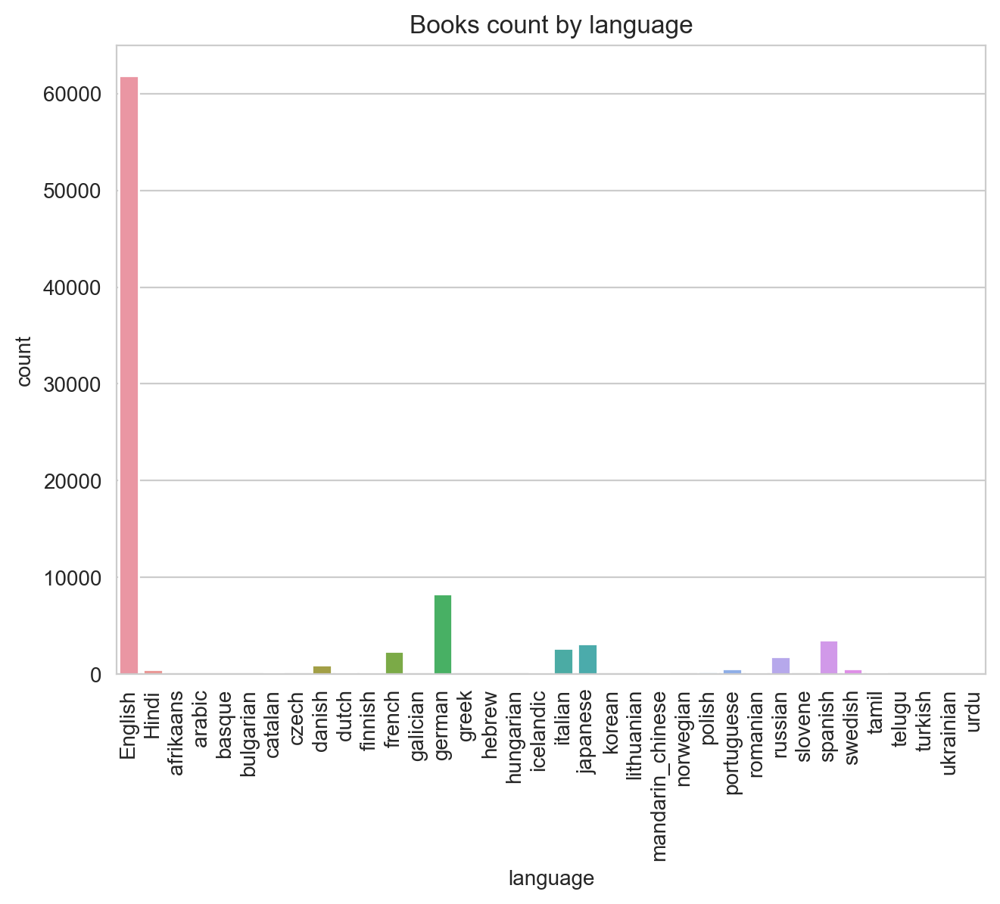

In [62]:
plt.xticks(rotation=90)
plt.tight_layout()
plt.title('Books count by language')
sns.countplot(x='language', data=audible.sort_values('language'))

;




### Q7: How many audio books by rating?

Only 17% of the books are rated and it can be seen below the number of books for each rating.

''

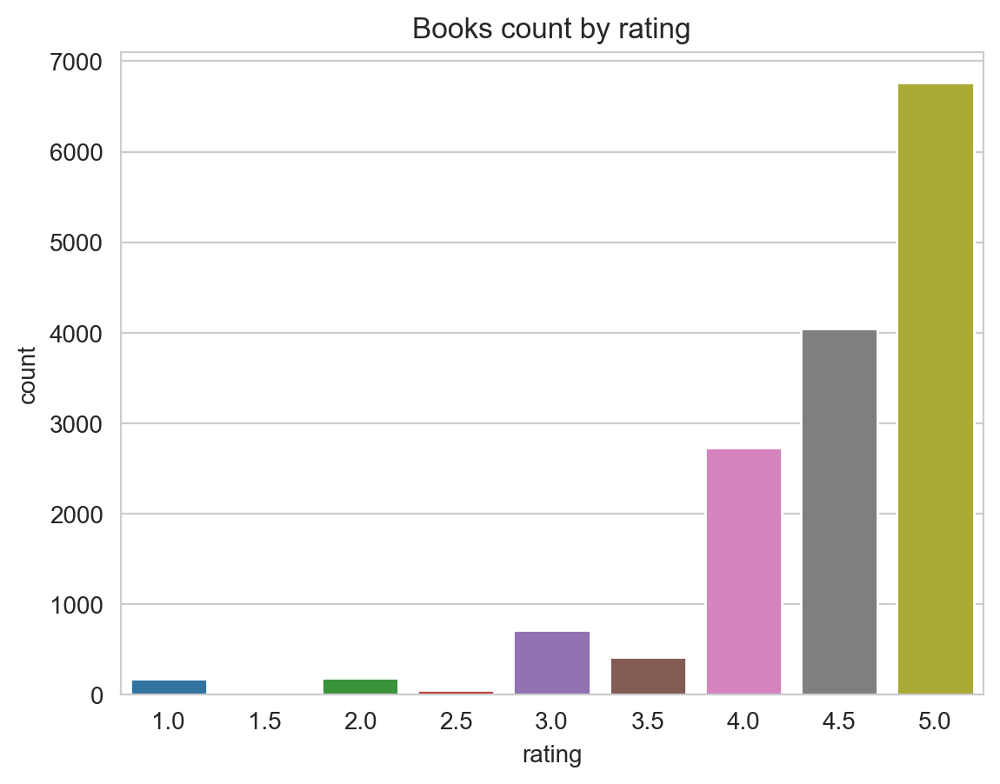

In [63]:
plt.title('Books count by rating')
sns.countplot(x='rating', data=audible)
;

### Q8: Show the anual releases comparing price to length?

In the Heatmap is show's the books released every year from 1998 to the anounced book at 2025 by length in minuts.

In [67]:
#audible = audible.sort_values('year',ascending=True)

fig = px.scatter(audible, x="length_minutes", y="price", animation_frame='year', animation_group="rating",
           size="price", color="language", hover_name="name", title='Annual released books by language grouped by rating',
           log_x=True, size_max=55, range_x=[1,10000], range_y=[0,8000])
    
fig['layout']['yaxis'].update(autorange = True)
fig.show()

;

''

### Q9: Describe prices distrbution? 

75th percentile of the books are below USD 1,000 while the most expinsive book is $7198.

''

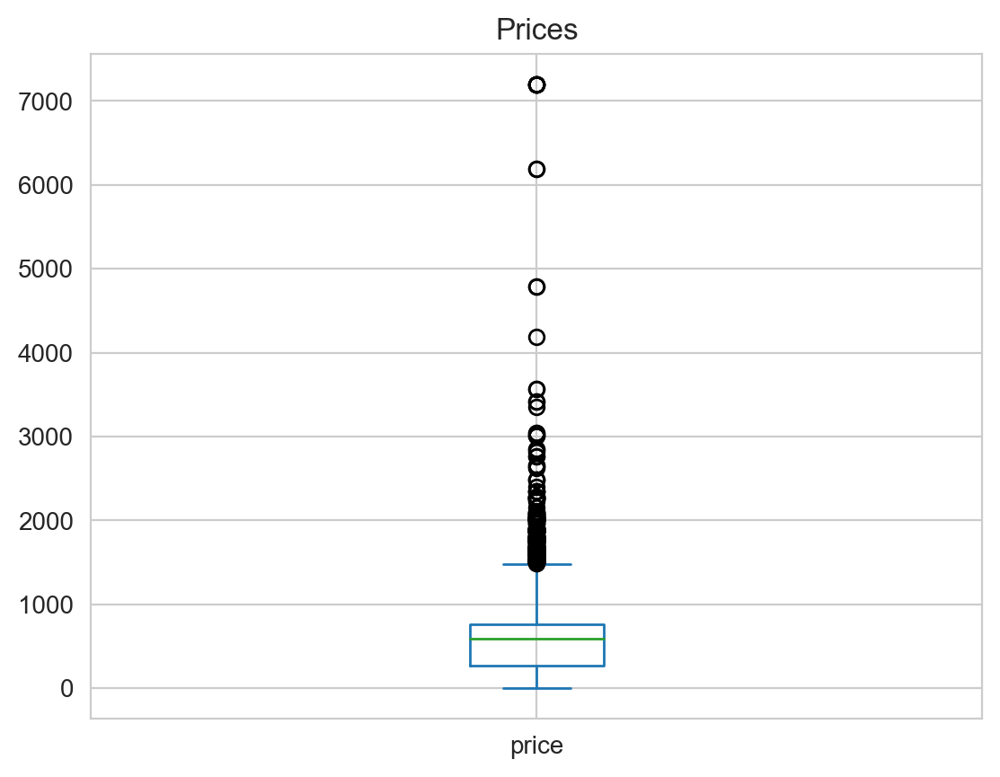

In [43]:
audible.price.plot(kind = 'box')
plt.title("prices".title())
;

### Q10: Show nulls distrbutuion in your dataset? 

The nulls are only in the rating and the count of rating due to not all the books are rated in the first place.

''

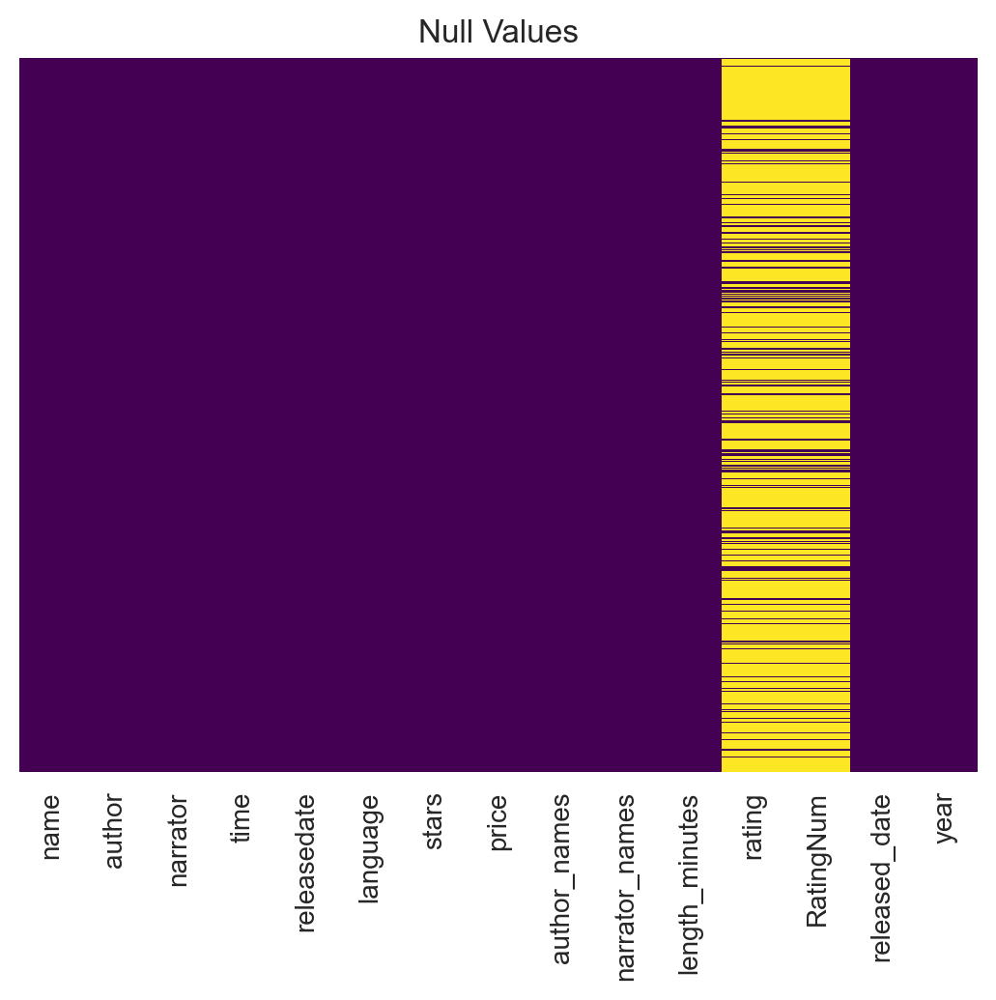

In [68]:
sns.heatmap(data=audible.isnull(), yticklabels=False, cbar=False, cmap='viridis' )
plt.title("Null Values".title())

;

### Conclusion:


In the analysis done it is shown that there is no correlation between atrributes except weak correlation between price and lenth and we found that most of the audio books are in English and the seconed most written language are Japanese books.
The prices range from free ($0) to the most expinsive book at $7189 which is a Japanese book, while 75th percentile of the books are below USD  $1,000.

Between 2015 and 2022 interqurtile of the English books were released, and the books written by an auther but some books are autherd by more than one and some are up to 4 auther. 

After the analysis we found that only 17% of the books has been rated by users. 
 

### Extra Graphs:

''

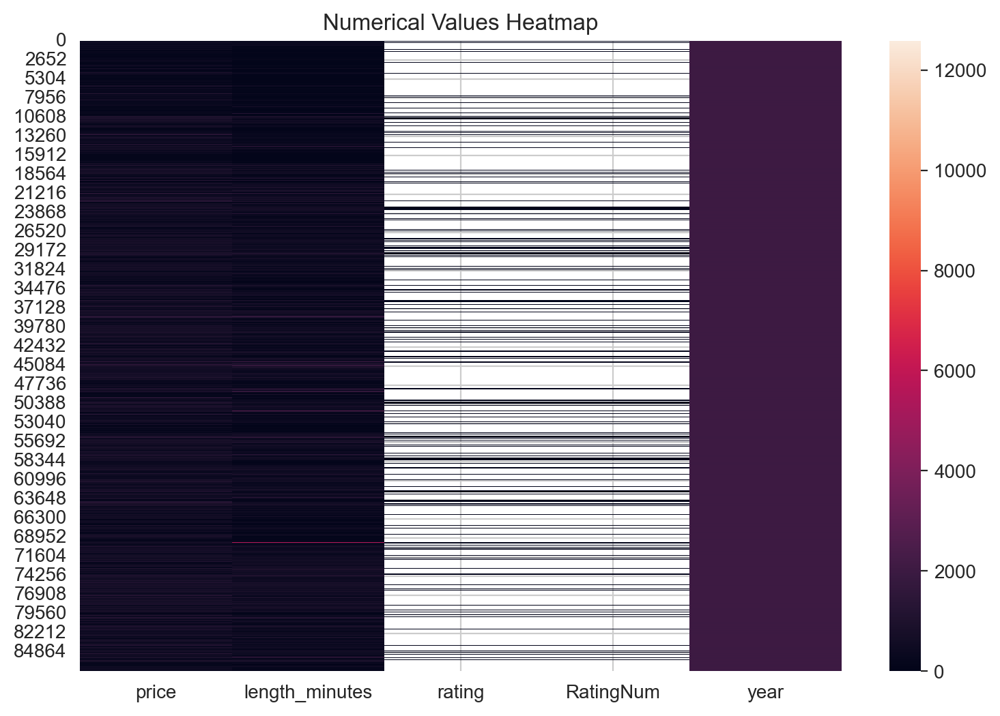

In [71]:
plt.figure(figsize = (9,6))
sns.heatmap(data = audible.select_dtypes('number'))
plt.title("Numerical Values Heatmap".title())

;

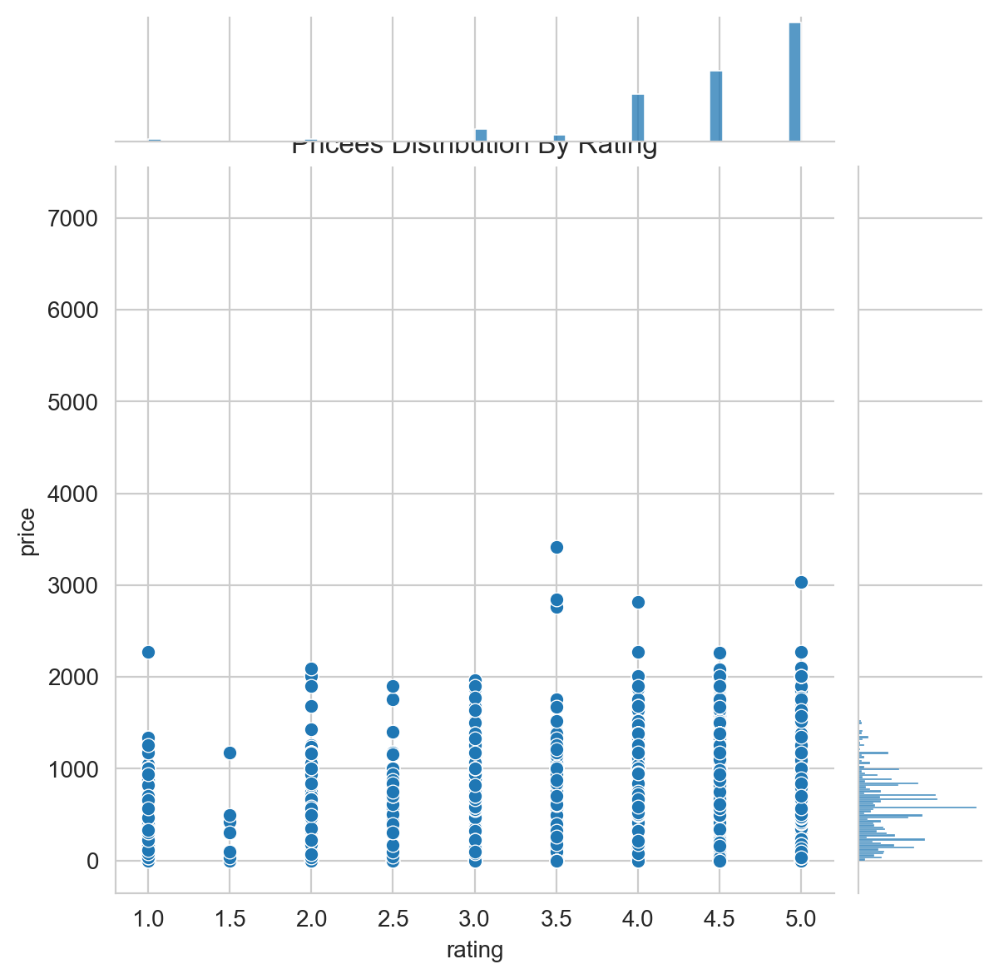

In [72]:
sns.jointplot(data=audible, y="price", x="rating");
plt.title("Pricees distribution by rating".title());


''

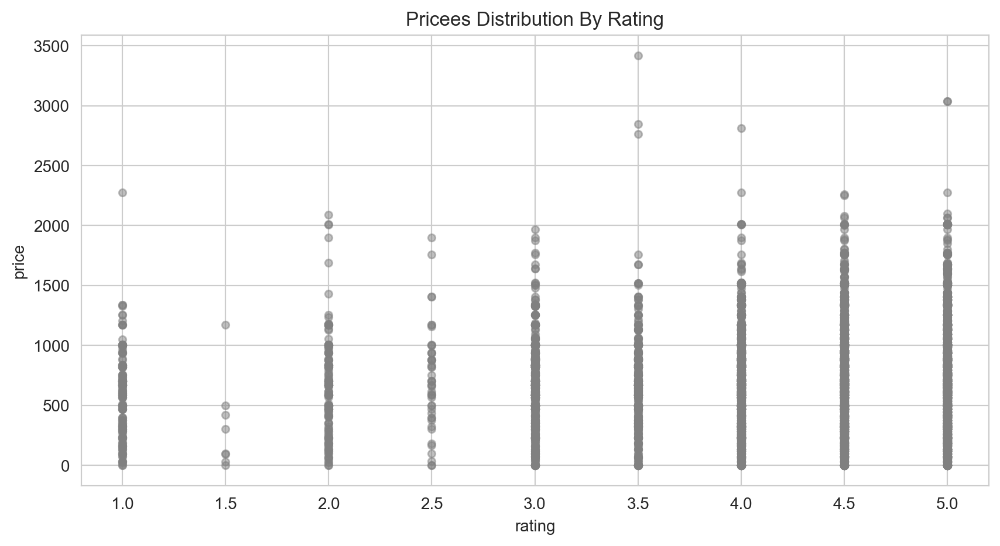

In [69]:
audible.plot(kind='scatter', x='rating', y='price', alpha =0.5, color = 'gray', figsize=(10,5))
plt.title("Pricees distribution by rating".title())


;

In [48]:
#audible['author_names'].value_counts().sort_values(ascending=False).plot(kind = 'bar')

''

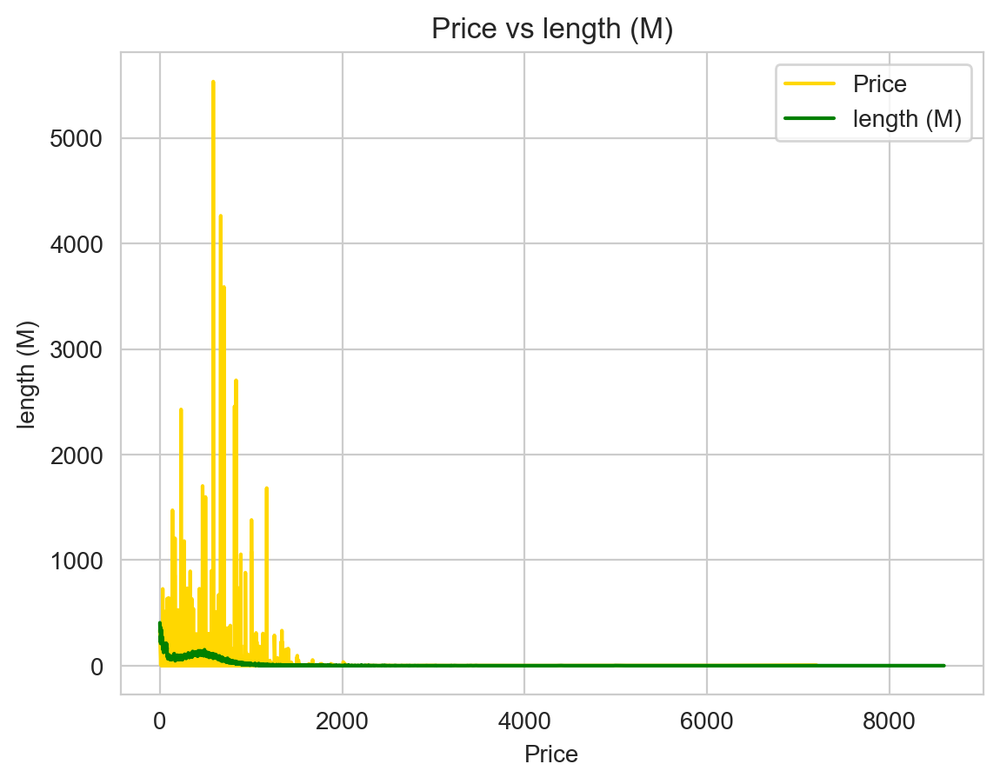

In [49]:
audible['price'].value_counts().sort_index().plot(label='Price', c='gold');
audible['length_minutes'].value_counts().sort_index().plot(label = 'length (M)', c = 'green');

# add axis labels
plt.xlabel('Price')
plt.ylabel('length (M)')
plt.title('Price vs length (M)')

#legend
plt.legend()



;

In [50]:
#sns.countplot(data = audible, x = 'author_names')

In [51]:
sortedDict = sorted(authors.items(), key=lambda x:x)
sortedDict

[('', 776),
 ('#DerApotheker', 1),
 ("'Mack'JayJordan", 1),
 ('(株)志麻ヒプノ・ソリューション', 10),
 ('11FREUNDE', 6),
 ('17Game-ChangingLeaders', 1),
 ('21-DayChallenges', 2),
 ('365Conseils', 1),
 ('50Cent', 1),
 ('92ndStreetY', 1),
 ('@dieserdad', 1),
 ("A'LeliaBundles", 1),
 ("A'zayler", 2),
 ('A.A.Brill-translator', 1),
 ('A.A.Dhand', 1),
 ('A.A.Milne', 14),
 ('A.Alpheus', 1),
 ('A.Amit', 1),
 ('A.B.Paterson', 1),
 ('A.B.Rutledge', 1),
 ('A.B.Saddlewick', 2),
 ('A.B.Simpson', 1),
 ('A.BartlettGiamatti', 1),
 ('A.C.Arthur', 4),
 ('A.C.Crispin', 2),
 ('A.C.Fuller', 1),
 ('A.C.Gaughen', 1),
 ('A.C.Grayling', 5),
 ('A.C.Hadfield', 1),
 ('A.C.Spahn', 1),
 ('A.C.Wilds', 1),
 ('A.D."Lumkile"Thomason', 1),
 ('A.D.AFrance-Williams', 1),
 ('A.D.GodleyTranslator', 1),
 ('A.D.Lubow', 1),
 ('A.D.Martel', 7),
 ('A.D.Robertson', 1),
 ('A.D.Rosenberg', 1),
 ('A.DanaMénardPhD', 1),
 ('A.Daudet', 1),
 ('A.DeRora', 1),
 ('A.DeborahBaker', 1),
 ('A.DouglasStone', 1),
 ('A.E.Ali', 1),
 ('A.E.Dooland', 1),
 ('A.E.H